In [1]:
%matplotlib inline 
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import glob
import os
import datetime
import cartopy.crs as ccrs
import cartopy
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

%config InlineBackend.figure_format ='retina'
stations = pd.read_csv('./data/StationsMaster.csv')

stationsList = stations.name.values
wbans = ['25704','23050','13705','25308','93037','25624','24155','23114','13858','23044','24114','13911','14739','22521','14936','13820','25503','12909','13702','23129','23119','13821','26617','13739','13714','13860','13743','13802','14804','13849','14771','13846','13909','14703','13967','13840','25339']
stns = ['704540','723650','745940','703980','945100','724660','703160','726880','723810','722210','722700','727855','722595','725090','911820','726540','747686','703260','722535','745980','722970','722860','722265','702000','724080','723030','722175','724050','724338','725377','747900','725190','747750','723535','744910','723530','745700','703610']

wbans = ['14739','14936','24155','25624','25308','23044','26617','25339','3940','23129','13967','23050','13743','93037','25503','13911','13739','14771','22521']
stns = ['945100','725090','727855','745940','723535','704540','703980','723810','722210','722970','723030','703260','722595','724338','725377','744910','745700','745980','722265','911820','722175','722535','722860','747686','747750','747900']

Reading in all the data from the .csv files, format the date, add a year column, sort on date

In [2]:
all_files = glob.glob(os.path.join("./data", "WorldTemps*.csv"))     # advisable to use os.path.join as this makes concatenation OS independent
df_from_each_file = (pd.read_csv(f) for f in all_files)
dfMaster   = pd.concat(df_from_each_file, ignore_index=True)

dfMaster['date'] = pd.to_datetime(dfMaster['date'])
dfMaster['year'] = dfMaster['date'].dt.year
dfMaster.sort_values(by=['date'], ascending=True, inplace=True)

dfMaster.info()
dfMaster.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1055553 entries, 0 to 1055552
Data columns (total 12 columns):
name        1055553 non-null object
state       1027949 non-null object
country     1055553 non-null object
stn         1055553 non-null int64
wban        1055553 non-null int64
date        1055553 non-null datetime64[ns, UTC]
meanTemp    1055553 non-null float64
maxTemp     1055553 non-null float64
minTemp     1055553 non-null float64
meanWdsp    1055553 non-null float64
gust        1055553 non-null float64
year        1055553 non-null int64
dtypes: datetime64[ns, UTC](1), float64(5), int64(3), object(3)
memory usage: 104.7+ MB


,name,state,country,stn,wban,date,meanTemp,maxTemp,minTemp,meanWdsp,gust,year
0,CHARLEVILLE,NaN,AS,945100,99999,1943-01-01 00:00:00+00:00,77.6,90.3,69.3,3.1,999.9,1943
8684,VANCE AFB,OK,US,723535,99999,1943-01-01 00:00:00+00:00,44.3,56.3,36.3,5.5,999.9,1943
4826,ROBINS AFB AIRPORT,GA,US,722175,13860,1943-01-01 00:00:00+00:00,46.4,64.4,34.3,3.1,999.9,1943
11206,FORT WORTH NAVAL AIR STATION,TX,US,722595,13911,1943-01-01 00:00:00+00:00,57.4,72.3,48.4,4.7,999.9,1943
4096,EGLIN AFB AIRPORT,FL,US,722210,13858,1943-01-01 00:00:00+00:00,47.0,63.3,32.4,2.8,999.9,1943


We need to normalize the station names now, as they can be different for the same place
stn and wban are our keys from the StationsMaster file

In [3]:
def NormalizeStationNames(stn, wban, date): 

    retName = ''
    if str(stn) in stns:        
        retName = stations[stations.stn == stn].name.values[0]
    else:
        retName = stations[stations.wban == wban].name.values[0]
    
    if date.day == 1 and date.month == 1 and retName == 'ADAK NAS':
        print(date.year, datetime.datetime.now())
    return retName


In [4]:

startTime = datetime.datetime.now()
dfMaster['nameNorm'] = [NormalizeStationNames(row[0], row[1], row[2]) for row in dfMaster[['stn', 'wban', 'date']].values]
print(datetime.datetime.now()-startTime) 

1943 2019-10-15 00:19:57.495139
1944 2019-10-15 00:20:04.368209
1945 2019-10-15 00:20:11.674057
1946 2019-10-15 00:20:18.928143
1947 2019-10-15 00:20:25.928447
1948 2019-10-15 00:20:33.262400
1949 2019-10-15 00:20:40.560417
1950 2019-10-15 00:20:48.054030
1951 2019-10-15 00:20:55.540725
1952 2019-10-15 00:21:03.005226
1953 2019-10-15 00:21:10.678441
1954 2019-10-15 00:21:18.198807
1955 2019-10-15 00:21:25.594121
1956 2019-10-15 00:21:33.161535
1957 2019-10-15 00:21:40.766682
1958 2019-10-15 00:21:48.433173
1959 2019-10-15 00:21:56.110103
1960 2019-10-15 00:22:03.577416
1961 2019-10-15 00:22:11.062030
1962 2019-10-15 00:22:19.048834
1963 2019-10-15 00:22:27.304043
1964 2019-10-15 00:22:34.718943
1965 2019-10-15 00:22:42.091991
1966 2019-10-15 00:22:49.608022
1967 2019-10-15 00:22:56.894247
1968 2019-10-15 00:23:04.229616
1969 2019-10-15 00:23:11.711204
1970 2019-10-15 00:23:19.062718
1971 2019-10-15 00:23:26.501605
1972 2019-10-15 00:23:33.870655
1973 2019-10-15 00:23:41.340082
1974 201

Let's map where the stations are



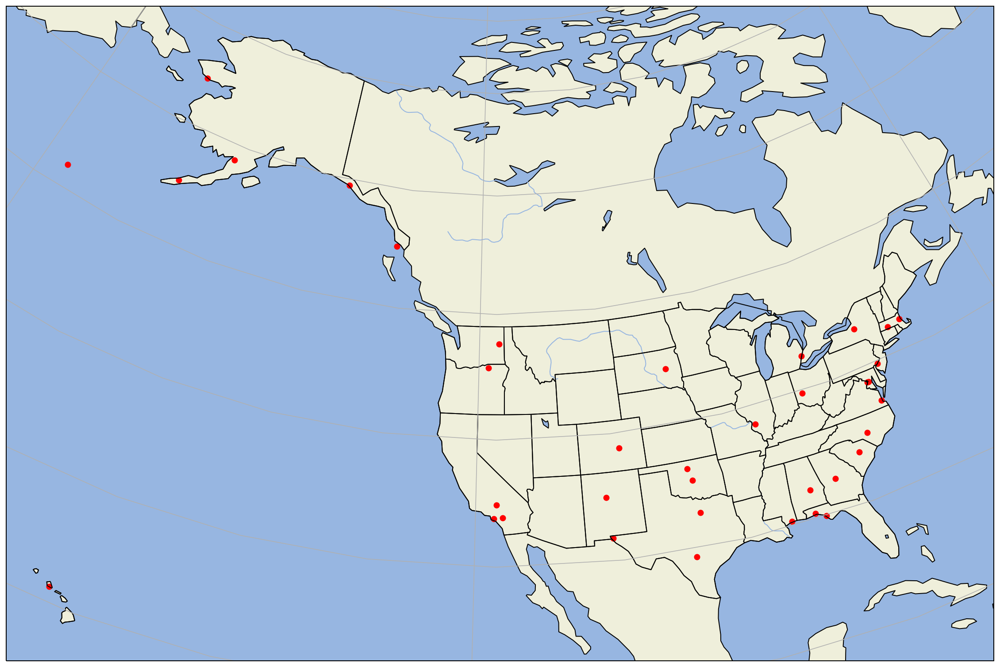

In [5]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

extent = [-160, -75, 17, 75]
central_lon = np.mean(extent[:2])
central_lat = np.mean(extent[2:])

lat = stations['lat'].values
lon = stations['lon'].values

fig = plt.figure(figsize=(20, 15))
ax = plt.subplot(111, projection=ccrs.AlbersEqualArea(central_lon, central_lat))
ax.set_extent(extent)

ax.add_feature(cartopy.feature.OCEAN)
ax.add_feature(cartopy.feature.LAND, edgecolor='black')
ax.add_feature(cartopy.feature.LAKES, edgecolor='black')
ax.add_feature(cartopy.feature.RIVERS)
ax.add_feature(cartopy.feature.BORDERS)
ax.add_feature(cartopy.feature.STATES)
ax.gridlines()
ax.scatter(lon,lat,  transform=ccrs.PlateCarree(), c='r')

plt.show();


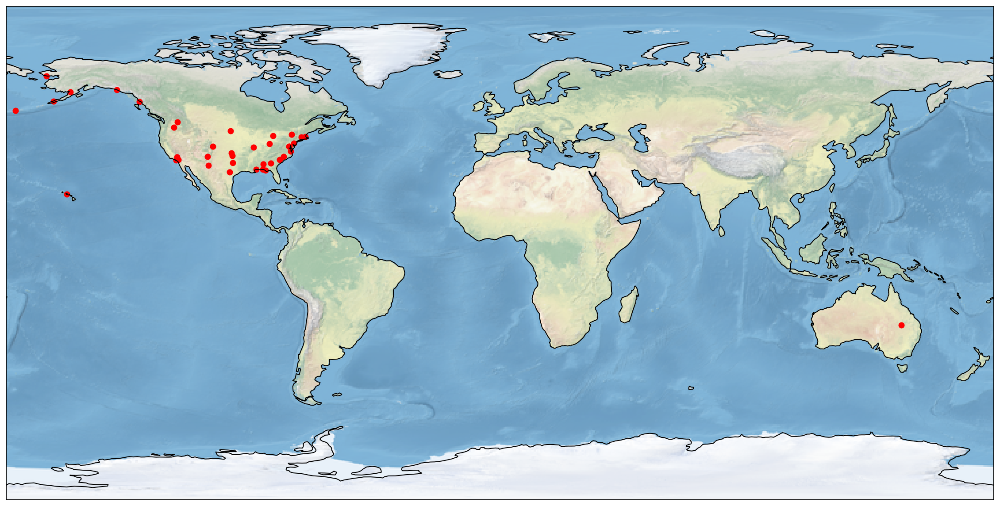

In [6]:
# https://uoftcoders.github.io/studyGroup/lessons/python/cartography/lesson/
lat2 = stations['lat'].values
lon2 = stations['lon'].values
extent = [-140, -70, 15, 80]
ax.set_extent(extent)
fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(1, 1, 1,
                     projection=ccrs.PlateCarree())
ax.scatter(lon2, lat2, c='r')
ax.stock_img()
ax.coastlines()
plt.show();

Let's plot the daily temps per place, should see a smooth range for them.

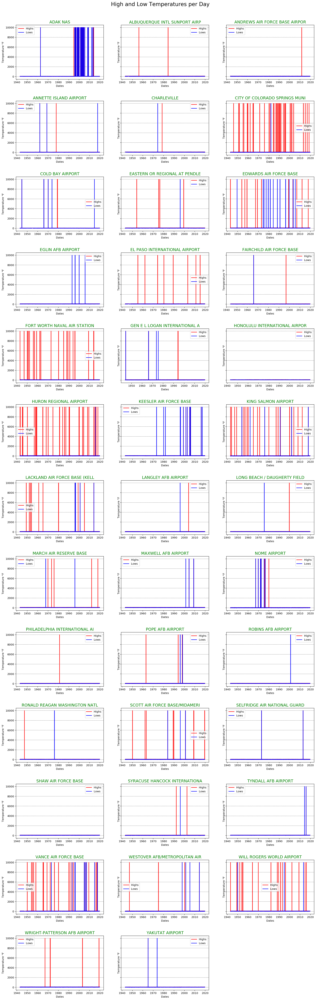

In [7]:
nrows, ncols = 13, 3

fig, axes = plt.subplots(nrows = nrows, ncols=ncols, figsize=(20,60), sharex=False, sharey=True)
plt.subplots_adjust(hspace=.4, wspace=.2, top=.96)
num = 1
for ax in axes.flatten()[:len(stationsList)]:
    
    stationName = stationsList[num-1]
    
    dfRowsStation = dfMaster[(dfMaster.nameNorm == stationName)]

    # Plot the lineplot
    ax.plot(dfRowsStation['date'], dfRowsStation['maxTemp'], marker='', color='red', linewidth=1.9, alpha=0.9, label='Highs')
    ax.plot(dfRowsStation['date'], dfRowsStation['minTemp'], marker='', color='blue', linewidth=1.9, alpha=0.9, label='Lows')
    
    ax.yaxis.grid(color='gray', linestyle='dashed')
    ax.set(xlabel='Dates', ylabel='Temperature \xb0F')
    ax.legend()

    ax.set_title(stationName, fontdict={'fontsize': 15, 'fontweight': 0, 'color':'green', 'ha':'center'}) 
    num = num + 1
fig.delaxes(axes[-1,-1])
fig.suptitle('High and Low Temperatures per Day', fontsize=20)
 
plt.show();

Ok, so we have some bad temperature values (9999), let's make them NaN if they're invalid


In [8]:
# https://stackoverflow.com/questions/52673285/performance-of-pandas-apply-vs-np-vectorize-to-create-new-column-from-existing-c
maxTempOld = np.array(dfMaster['maxTemp'].values.tolist())
minTempOld = np.array(dfMaster['minTemp'].values.tolist())

dfMaster['maxTempNorm'] = np.where(np.logical_and(maxTempOld >= -150, maxTempOld <= 180), maxTempOld, np.nan).tolist()
dfMaster['minTempNorm'] = np.where(np.logical_and(minTempOld >= -150, minTempOld <= 180), minTempOld, np.nan).tolist()

dfMaster.info()
dfMaster.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1055553 entries, 0 to 1055552
Data columns (total 15 columns):
name           1055553 non-null object
state          1027949 non-null object
country        1055553 non-null object
stn            1055553 non-null int64
wban           1055553 non-null int64
date           1055553 non-null datetime64[ns, UTC]
meanTemp       1055553 non-null float64
maxTemp        1055553 non-null float64
minTemp        1055553 non-null float64
meanWdsp       1055553 non-null float64
gust           1055553 non-null float64
year           1055553 non-null int64
nameNorm       1055553 non-null object
maxTempNorm    1055170 non-null float64
minTempNorm    1055320 non-null float64
dtypes: datetime64[ns, UTC](1), float64(7), int64(3), object(4)
memory usage: 128.9+ MB


,name,state,country,stn,wban,date,meanTemp,maxTemp,minTemp,meanWdsp,gust,year,nameNorm,maxTempNorm,minTempNorm
0,CHARLEVILLE,NaN,AS,945100,99999,1943-01-01 00:00:00+00:00,77.6,90.3,69.3,3.1,999.9,1943,CHARLEVILLE,90.3,69.3
8684,VANCE AFB,OK,US,723535,99999,1943-01-01 00:00:00+00:00,44.3,56.3,36.3,5.5,999.9,1943,VANCE AIR FORCE BASE,56.3,36.3
4826,ROBINS AFB AIRPORT,GA,US,722175,13860,1943-01-01 00:00:00+00:00,46.4,64.4,34.3,3.1,999.9,1943,ROBINS AFB AIRPORT,64.4,34.3
11206,FORT WORTH NAVAL AIR STATION,TX,US,722595,13911,1943-01-01 00:00:00+00:00,57.4,72.3,48.4,4.7,999.9,1943,FORT WORTH NAVAL AIR STATION,72.3,48.4
4096,EGLIN AFB AIRPORT,FL,US,722210,13858,1943-01-01 00:00:00+00:00,47.0,63.3,32.4,2.8,999.9,1943,EGLIN AFB AIRPORT,63.3,32.4


Let's plot the temps again


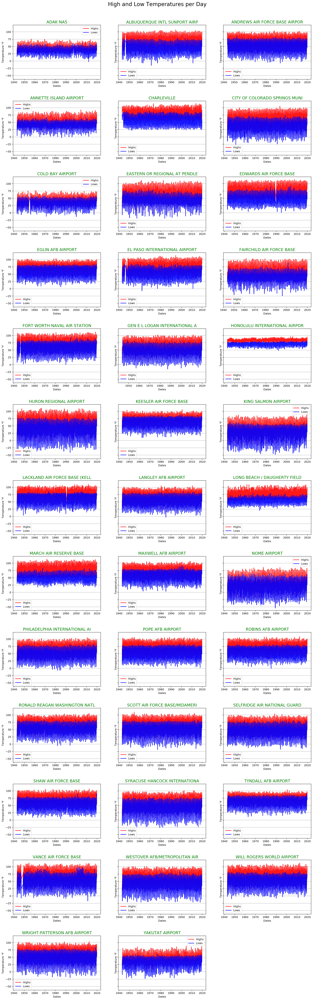

In [9]:
nrows, ncols = 13, 3

fig, axes = plt.subplots(nrows = nrows, ncols=ncols, figsize=(20,60), sharex=False, sharey=True)
plt.subplots_adjust(hspace=.4, wspace=.2, top=.96)
num = 1
for ax in axes.flatten()[:len(stationsList)]:
    
    stationName = stationsList[num-1]
    
    dfRowsStation = dfMaster[(dfMaster.nameNorm == stationName)]

    # Plot the lineplot
    ax.plot(dfRowsStation['date'], dfRowsStation['maxTempNorm'], marker='', color='red', linewidth=1.9, alpha=0.9, label='Highs')
    ax.plot(dfRowsStation['date'], dfRowsStation['minTempNorm'], marker='', color='blue', linewidth=1.9, alpha=0.9, label='Lows')
    
    ax.yaxis.grid(color='gray', linestyle='dashed')
    ax.set(xlabel='Dates', ylabel='Temperature \xb0F')
    ax.legend()

    ax.set_title(stationName, fontdict={'fontsize': 15, 'fontweight': 0, 'color':'green', 'ha':'center'}) 
    num = num + 1
fig.delaxes(axes[-1,-1])
fig.suptitle('High and Low Temperatures per Day', fontsize=20)
  
plt.show();


Let's look at how many temperature recordings per place we have


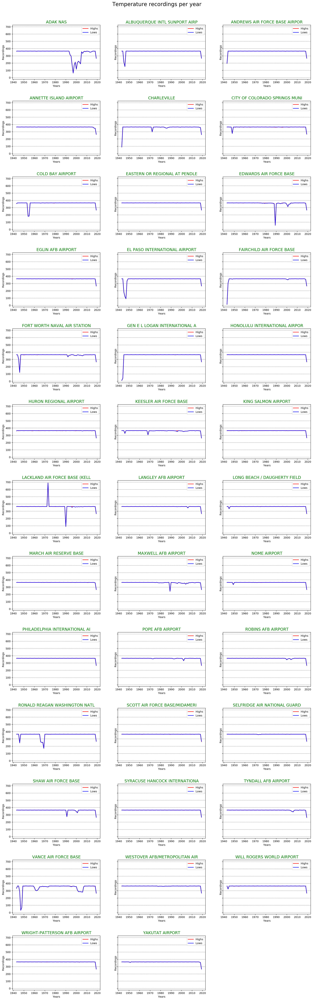

In [10]:
nrows, ncols = 13, 3

# https://stackoverflow.com/questions/28070906/loop-over-2d-subplot-as-if-its-a-1-d
fig, axes = plt.subplots(nrows = nrows, ncols=ncols, figsize=(20,60), sharex=False, sharey=True)
plt.subplots_adjust(hspace=.4, wspace=.2, top=.96)
num = 1
for ax in axes.flatten()[:len(stationsList)]:
    
    stationName = stationsList[num-1]
    
    dfRowsStation = dfMaster[(dfMaster.nameNorm == stationName)]
    
    dfStationMax = dfRowsStation.groupby(['year']).maxTempNorm.agg('count').to_frame('Maxes').reset_index()
    dfStationMin = dfRowsStation.groupby(['year']).minTempNorm.agg('count').to_frame('Mins').reset_index()
    
    # Plot the lineplot
    ax.plot(dfStationMax['year'], dfStationMax['Maxes'], marker='', color='red', linewidth=1.9, alpha=0.9, label='Highs')
    ax.plot(dfStationMin['year'], dfStationMin['Mins'], marker='', color='blue', linewidth=1.9, alpha=0.9, label='Lows')
    
    ax.yaxis.grid(color='gray', linestyle='dashed')
    
    ax.set(xlabel='Years', ylabel='Recordings')
    
    ax.legend()
    ax.set_title(stationName, fontdict={'fontsize': 15, 'fontweight': 0, 'color':'green', 'ha':'center'}) 
    num = num + 1
fig.delaxes(axes[-1,-1])
fig.suptitle('Temperature recordings per year', fontsize=20)
   
plt.show();

We see that there's quite a few missing recordings, but also that Lackland Air Force Base has some temperatures doubled up, let's get rid of them


In [11]:
l = dfMaster[(dfMaster.stn == 722535)].groupby(['year']).maxTempNorm.agg('count')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(l)



year
1943    365
1944    366
1945    365
1946    365
1947    365
1948    366
1949    364
1950    365
1951    364
1952    366
1953    364
1954    364
1955    365
1956    366
1957    365
1958    365
1959    365
1960    366
1961    364
1962    365
1963    365
1964    366
1965    364
1966    365
1967    365
1968    366
1969    365
1970    365
1971    365
1972    366
1973    690
1974    365
1975    365
1976    366
1977    365
1978    365
1979    365
1980    364
1981    365
1982    365
1983    365
1984    366
1985    365
1986    365
1987    365
1988    366
1989    365
1990     90
1991    365
1992    366
1993    365
1994    365
1995    365
1996    365
1997    365
1998    364
1999    358
2000    363
2001    360
2002    364
2003    361
2004    364
2005    363
2006    361
2007    364
2008    366
2009    365
2010    365
2011    365
2012    366
2013    365
2014    364
2015    365
2016    366
2017    365
2018    365
2019    267
Name: maxTempNorm, dtype: int64

1973 is the bad year, with doubled data, let's look at it

In [12]:
l = dfMaster[(dfMaster.stn == 722535) & (dfMaster.year == 1973)]
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(l)


,name,state,country,stn,wban,date,meanTemp,maxTemp,minTemp,meanWdsp,gust,year,nameNorm,maxTempNorm,minTempNorm
493460,LACKLAND AFB KELLY,TX,US,722535,99999,1973-01-01 00:00:00+00:00,48.0,55.9,42.1,11.2,28.0,1973,LACKLAND AIR FORCE BASE (KELL,55.9,42.1
493461,LACKLAND AFB KELLY,TX,US,722535,99999,1973-01-02 00:00:00+00:00,38.7,41.0,37.4,10.9,27.0,1973,LACKLAND AIR FORCE BASE (KELL,41.0,37.4
493462,LACKLAND AFB KELLY,TX,US,722535,99999,1973-01-03 00:00:00+00:00,43.4,60.8,30.2,4.5,999.9,1973,LACKLAND AIR FORCE BASE (KELL,60.8,30.2
493463,LACKLAND AFB KELLY,TX,US,722535,99999,1973-01-04 00:00:00+00:00,46.4,55.4,35.6,3.3,999.9,1973,LACKLAND AIR FORCE BASE (KELL,55.4,35.6
493464,LACKLAND AFB KELLY,TX,US,722535,99999,1973-01-05 00:00:00+00:00,49.9,55.4,48.0,6.3,999.9,1973,LACKLAND AIR FORCE BASE (KELL,55.4,48.0
493465,LACKLAND AFB KELLY,TX,US,722535,99999,1973-01-06 00:00:00+00:00,42.7,53.6,37.4,10.8,21.0,1973,LACKLAND AIR FORCE BASE (KELL,53.6,37.4
493466,LACKLAND AFB KELLY,TX,US,722535,99999,1973-01-07 00:00:00+00:00,38.2,42.8,35.6,9.2,999.9,1973,LACKLAND AIR FORCE BASE (KELL,42.8,35.6
493467,LACKLAND AFB KELLY,TX,US,722535,99999,1973-01-08 00:00:00+00:00,37.9,44.6,32.0,11.0,20.0,1973,LACKLAND AIR FORCE BASE (KELL,44.6,32.0
493468,LACKLAND AFB KELLY,TX,US,722535,99999,1973-01-09 00:00:00+00:00,30.8,37.4,28.4,11.4,20.0,1973,LACKLAND AIR FORCE BASE (KELL,37.4,28.4
493469,LACKLAND AFB KELLY,TX,US,722535,99999,1973-01-10 00:00:00+00:00,27.2,30.2,24.8,9.0,999.9,1973,LACKLAND AIR FORCE BASE (KELL,30.2,24.8


So we'll drop some of them


In [13]:
indexNames = dfMaster[(dfMaster.stn == 722535) & (dfMaster.wban == 12909) & (dfMaster.year == 1973)].index
len(indexNames)
dfMasterDropped = dfMaster.drop(indexNames)
dfMasterDropped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1055197 entries, 0 to 1055552
Data columns (total 15 columns):
name           1055197 non-null object
state          1027593 non-null object
country        1055197 non-null object
stn            1055197 non-null int64
wban           1055197 non-null int64
date           1055197 non-null datetime64[ns, UTC]
meanTemp       1055197 non-null float64
maxTemp        1055197 non-null float64
minTemp        1055197 non-null float64
meanWdsp       1055197 non-null float64
gust           1055197 non-null float64
year           1055197 non-null int64
nameNorm       1055197 non-null object
maxTempNorm    1054814 non-null float64
minTempNorm    1054964 non-null float64
dtypes: datetime64[ns, UTC](1), float64(7), int64(3), object(4)
memory usage: 128.8+ MB


Let's look at the number of recordings per year again to confirm

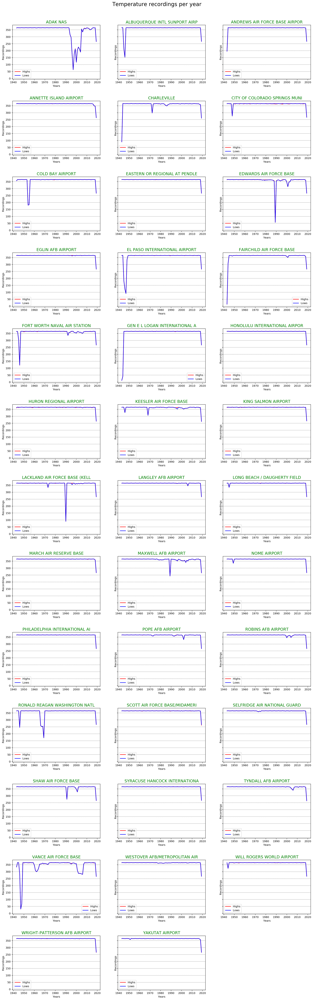

In [14]:
nrows, ncols = 13, 3

# https://stackoverflow.com/questions/28070906/loop-over-2d-subplot-as-if-its-a-1-d
fig, axes = plt.subplots(nrows = nrows, ncols=ncols, figsize=(20,60), sharex=False, sharey=True)
plt.subplots_adjust(hspace=.4, wspace=.2, top=.96)
num = 1
for ax in axes.flatten()[:len(stationsList)]:
    
    stationName = stationsList[num-1]
    
    dfRowsStation = dfMasterDropped[(dfMasterDropped.nameNorm == stationName)]
          
    # https://stackoverflow.com/questions/48770035/adding-a-count-column-to-the-result-of-a-groupby-in-pandas
    dfStationMax = dfRowsStation.groupby(['year']).maxTempNorm.agg('count').to_frame('Maxes').reset_index()
    dfStationMin = dfRowsStation.groupby(['year']).minTempNorm.agg('count').to_frame('Mins').reset_index()
    
    # Plot the lineplot
    ax.plot(dfStationMax['year'], dfStationMax['Maxes'], marker='', color='red', linewidth=1.9, alpha=0.9, label='Highs')
    ax.plot(dfStationMin['year'], dfStationMin['Mins'], marker='', color='blue', linewidth=1.9, alpha=0.9, label='Lows')
    
    ax.yaxis.grid(color='gray', linestyle='dashed')
    ax.set(xlabel='Years', ylabel='Recordings')
    
    ax.legend()
    ax.set_title(stationName, fontdict={'fontsize': 15, 'fontweight': 0, 'color':'green', 'ha':'center'}) 
    num = num + 1
fig.delaxes(axes[-1,-1])
fig.suptitle('Temperature recordings per year', fontsize=20)
  
plt.show();


Ok, now we just have missing data, but at least no extra data.
There's a dip at the end because we're not finished with  2019 yet.
Our next step will be to start looking for new daily record highs and lows.

I'm creating a dataframe to hold just daily records per place, with no year,
and also one to hold every records that breaks a previous one, per day, per place.

In [15]:
# https://stackoverflow.com/questions/36462257/create-empty-dataframe-in-pandas-specifying-column-types
dtypes = np.dtype([
            ('date', np.datetime64),
            ('year', int),
            ('month', int),
            ('day', int),
            ('name', str),
            ('maxMinType', str),
            ('temp', float),
            ])
data = np.empty(0, dtype=dtypes)
dfAllRecords = pd.DataFrame(data)


In [16]:
dtypes = np.dtype([
            ('month', int),   
            ('day', int), 
            ('name', str),
            ('maxTemp', float),
            ('minTemp', float),
            ('yearMax', int),
            ('yearMin', int),
            ])

data = np.empty(0, dtype=dtypes)
dfDailyRecords = pd.DataFrame(data)

In [17]:
def CheckForRecordList(date, stationName, curMaxTemp, curMinTemp):
    
    dict1 = {} 
    dfRowRec = dfDailyRecords[(dfDailyRecords.month == date.month) & (dfDailyRecords.day == date.day) & (dfDailyRecords.name == stationName)]

    if date.day == 1 and date.month == 1 and stationName == 'ADAK NAS':
        print(date.year, datetime.datetime.now())
    
        
    #If that day's row doesn't exist in the Daily Records table...        
    if len(dfRowRec.index) == 0:
        # If at least one of Current Max or Min is a real number
        if not (np.isnan(curMaxTemp) and np.isnan(curMinTemp)):
            # Insert that row into the Daily Records table
            newRow = [date.month, date.day, stationName, curMaxTemp, curMinTemp, date.year, date.year]
            dfDailyRecords.loc[len(dfDailyRecords)] = newRow
            
    else: # That day/month/name row does exist in the records table..
        if not np.isnan(curMaxTemp): #If the Current Max is a real number...  
            if not np.isnan(dfRowRec['maxTemp'].values[0]):   # If there's a real number in the Daily Records        
                #Compare to what's in the daily Record table..
                if curMaxTemp > dfRowRec['maxTemp'].values[0] :
                    #Replace it if it's bigger
                    dfDailyRecords.loc[(dfDailyRecords.month == date.month) & (dfDailyRecords.day == date.day) & (dfDailyRecords.name == stationName), 'maxTemp'] = curMaxTemp
                    dfDailyRecords.loc[(dfDailyRecords.month == date.month) & (dfDailyRecords.day == date.day) & (dfDailyRecords.name == stationName), 'yearMax'] = date.year
                                        
                    #newRow = [date, date.year, date.month, date.day, stationName, 'max', curMaxTemp]
                    #dfAllRecords.loc[len(dfAllRecords)] = newRow
                    dict1 = {'date': date, 'year': date.year, 'month':date.month, 'day': date.day, 'name': stationName, 'maxMinType': 'max', 'temp': curMaxTemp}
                    AllRecRows_list.append(dict1)
                    #print('bob1', dict1)
                
            else:   # If the cell in the Daily Records is empty
                # Just put this one there
                dfDailyRecords.loc[(dfDailyRecords.month == date.month) & (dfDailyRecords.day == date.day) & (dfDailyRecords.name == stationName), 'maxTemp'] = curMaxTemp
                dfDailyRecords.loc[(dfDailyRecords.month == date.month) & (dfDailyRecords.day == date.day) & (dfDailyRecords.name == stationName), 'yearMax'] = date.year
        
        if not np.isnan(curMinTemp): #If the Current Min is a real number...  
            if not np.isnan(dfRowRec['minTemp'].values[0]):   # If there's a real number in the Daily Records        
                #Compare to what's in the daily Record table..
                if curMinTemp < dfRowRec['minTemp'].values[0] :
                    #Replace it if it's bigger
                    dfDailyRecords.loc[(dfDailyRecords.month == date.month) & (dfDailyRecords.day == date.day) & (dfDailyRecords.name == stationName), 'minTemp'] = curMinTemp
                    dfDailyRecords.loc[(dfDailyRecords.month == date.month) & (dfDailyRecords.day == date.day) & (dfDailyRecords.name == stationName), 'yearMin'] = date.year
                    
                    #newRow = [date, date.year, date.month, date.day, stationName, 'min', curMinTemp]
                    #dfAllRecords.loc[len(dfAllRecords)] = newRow
                
                    dict1 = {'date': date, 'year': date.year, 'month':date.month, 'day': date.day, 'name': stationName, 'maxMinType': 'min', 'temp': curMinTemp}
                    AllRecRows_list.append(dict1)
                    #print('bob2', dict1)
                    
            else:   # If the cell in the Daily Records is empty
                # Just put this one there
                dfDailyRecords.loc[(dfDailyRecords.month == date.month) & (dfDailyRecords.day == date.day) & (dfDailyRecords.name == stationName), 'minTemp'] = curMinTemp
                dfDailyRecords.loc[(dfDailyRecords.month == date.month) & (dfDailyRecords.day == date.day) & (dfDailyRecords.name == stationName), 'yearMin'] = date.year
    
print('done')

done


In [18]:
startTime = datetime.datetime.now()
AllRecRows_list = []
[CheckForRecordList(row[0], row[1], row[2], row[3]) for row in dfMasterDropped[['date', 'nameNorm', 'maxTempNorm', 'minTempNorm']].values]

dfAllRecords = pd.DataFrame(AllRecRows_list)
print(datetime.datetime.now()-startTime) 


1943 2019-10-15 00:30:26.141278
1944 2019-10-15 00:31:26.213979
1945 2019-10-15 00:33:08.148046
1946 2019-10-15 00:34:31.172919
1947 2019-10-15 00:35:39.088888
1948 2019-10-15 00:36:39.606266
1949 2019-10-15 00:37:36.543306
1950 2019-10-15 00:38:31.449255
1951 2019-10-15 00:39:23.428631
1952 2019-10-15 00:40:12.097314
1953 2019-10-15 00:40:57.998398
1954 2019-10-15 00:41:43.272961
1955 2019-10-15 00:42:26.623045
1956 2019-10-15 00:43:08.990966
1957 2019-10-15 00:43:50.519371
1958 2019-10-15 00:44:29.254898
1959 2019-10-15 00:45:07.180818
1960 2019-10-15 00:45:44.865936
1961 2019-10-15 00:46:23.431702
1962 2019-10-15 00:47:01.205641
1963 2019-10-15 00:47:39.022490
1964 2019-10-15 00:48:18.940366
1965 2019-10-15 00:48:56.547162
1966 2019-10-15 00:49:33.190271
1967 2019-10-15 00:50:08.615209
1968 2019-10-15 00:50:45.184113
1969 2019-10-15 00:51:20.073393
1970 2019-10-15 00:51:53.814044
1971 2019-10-15 00:52:29.146046
1972 2019-10-15 00:53:05.031945
1973 2019-10-15 00:53:40.697212
1974 201

In [19]:
dfAllRecords.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105538 entries, 0 to 105537
Data columns (total 7 columns):
date          105538 non-null datetime64[ns, UTC]
year          105538 non-null int64
month         105538 non-null int64
day           105538 non-null int64
name          105538 non-null object
maxMinType    105538 non-null object
temp          105538 non-null float64
dtypes: datetime64[ns, UTC](1), float64(1), int64(3), object(2)
memory usage: 5.6+ MB


Let's take a look at AllRecords, they should trend up for highs, down for lows

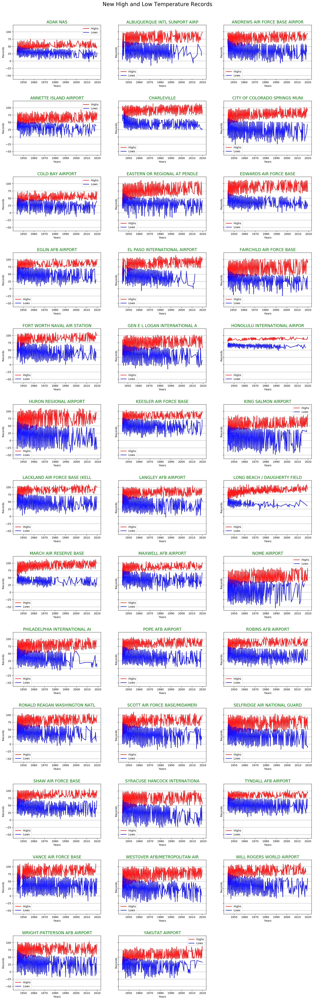

In [20]:
nrows, ncols = 13, 3

fig, axes = plt.subplots(nrows = nrows, ncols=ncols, figsize=(20,60), sharex=False, sharey=True)
plt.subplots_adjust(hspace=.4, wspace=.2, top=.96)
num = 1
for ax in axes.flatten()[:len(stationsList)]:
    
    stationName = stationsList[num-1]
    
    dfRowsStationMax = dfAllRecords[(dfAllRecords.name == stationName) & (dfAllRecords.maxMinType == 'max')]
    dfRowsStationMin = dfAllRecords[(dfAllRecords.name == stationName) & (dfAllRecords.maxMinType == 'min')]
    
    # Plot the lineplot
    ax.plot(dfRowsStationMax['date'], dfRowsStationMax['temp'], marker='', color='red', linewidth=1.9, alpha=0.9, label='Highs')
    ax.plot(dfRowsStationMin['date'], dfRowsStationMin['temp'], marker='', color='blue', linewidth=1.9, alpha=0.9, label='Lows')
    
    
    ax.yaxis.grid(color='gray', linestyle='dashed')
    ax.set(xlabel='Years', ylabel='Records')
    ax.legend()

    ax.set_title(stationName, fontdict={'fontsize': 15, 'fontweight': 0, 'color':'green', 'ha':'center'}) 
    num = num + 1
fig.delaxes(axes[-1,-1])
fig.suptitle('New High and Low Temperature Records', fontsize=20)
  
plt.show();

Count of new records set per year, per place

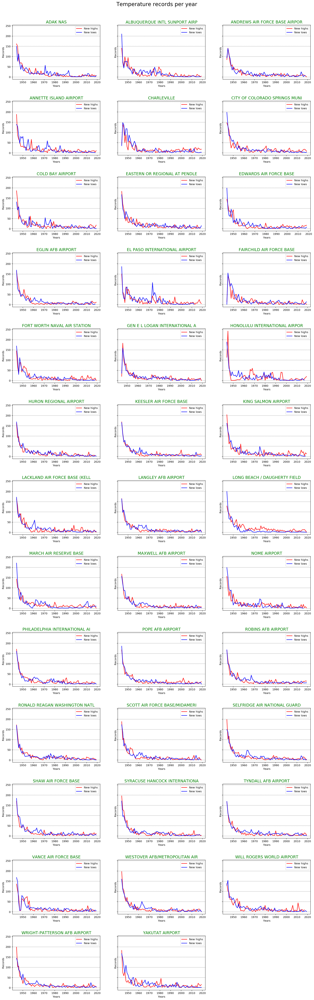

In [21]:
nrows, ncols = 13, 3

fig, axes = plt.subplots(nrows = nrows, ncols=ncols, figsize=(20,60), sharex=False, sharey=True)
plt.subplots_adjust(hspace=.4, wspace=.2, top=.96)
num = 1
for ax in axes.flatten()[:len(stationsList)]:
    
    stationName = stationsList[num-1]
    
    dfRowsHighs = dfAllRecords[(dfAllRecords.name == stationName) & (dfAllRecords.maxMinType == 'max')]
    dfRowsLows = dfAllRecords[(dfAllRecords.name == stationName) & (dfAllRecords.maxMinType == 'min')]
      
    dfHighs = dfRowsHighs.groupby(['year', 'name', 'maxMinType']).maxMinType.agg('count').to_frame('Highs').reset_index()
    dfLows = dfRowsLows.groupby(['year', 'name', 'maxMinType']).maxMinType.agg('count').to_frame('Lows').reset_index()
 
    # Plot the lineplot
    ax.plot(dfHighs['year'], dfHighs['Highs'], marker='', color='red', linewidth=1.9, alpha=0.9, label='New highs')
    ax.plot(dfLows['year'], dfLows['Lows'], marker='', color='blue', linewidth=1.9, alpha=0.9, label='New lows')
    
    ax.yaxis.grid(color='gray', linestyle='dashed')
    ax.set(xlabel='Years', ylabel='Records')
    ax.legend()

    ax.set_title(stationName, fontdict={'fontsize': 15, 'fontweight': 0, 'color':'green', 'ha':'center'}) 
    num = num + 1
fig.delaxes(axes[-1,-1])
fig.suptitle('Temperature records per year', fontsize=20)
  
plt.show();

Now let's look overall

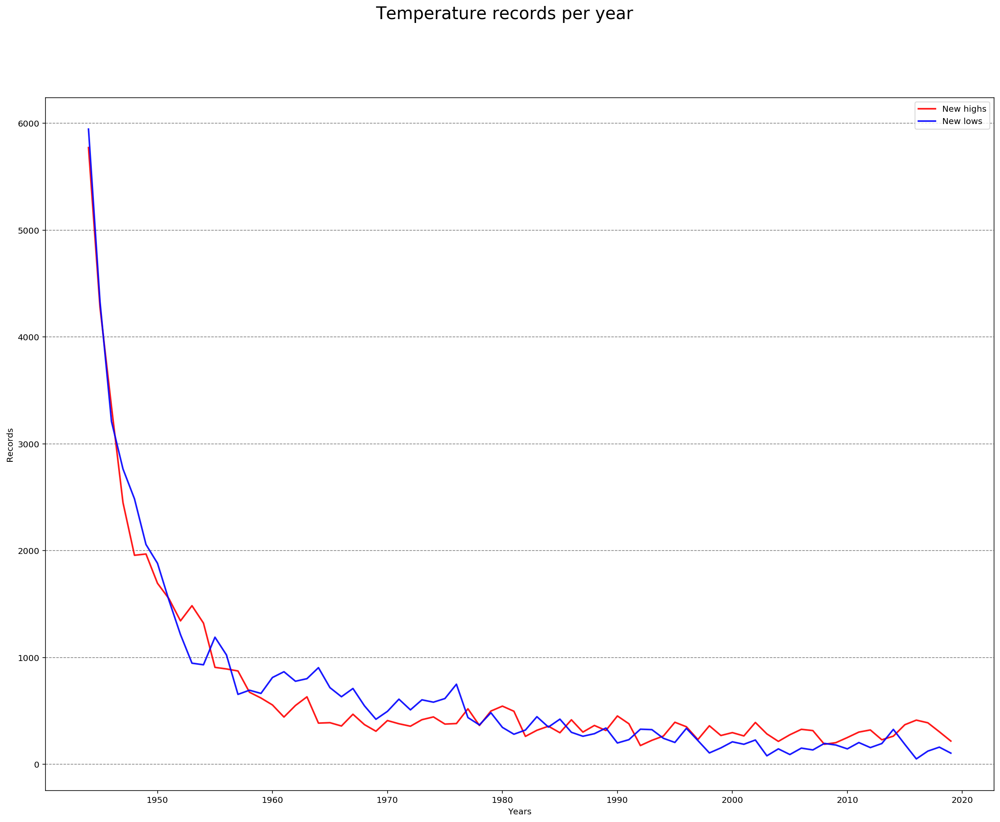

In [22]:
fig, ax = plt.subplots(figsize=(20,15))

dfRowsHighs = dfAllRecords[(dfAllRecords.maxMinType == 'max')]
dfRowsLows = dfAllRecords[(dfAllRecords.maxMinType == 'min')]
  
dfHighs = dfRowsHighs.groupby(['year', 'maxMinType']).maxMinType.agg('count').to_frame('Highs').reset_index()
dfLows = dfRowsLows.groupby(['year', 'maxMinType']).maxMinType.agg('count').to_frame('Lows').reset_index()

# Plot the lineplot
ax.plot(dfHighs['year'], dfHighs['Highs'], marker='', color='red', linewidth=1.9, alpha=0.9, label='New highs')
ax.plot(dfLows['year'], dfLows['Lows'], marker='', color='blue', linewidth=1.9, alpha=0.9, label='New lows')

ax.yaxis.grid(color='gray', linestyle='dashed')
ax.set(xlabel='Years', ylabel='Records')
ax.legend()

fig.suptitle('Temperature records per year', fontsize=20)
  
plt.show();



Let's try the same in a bar plot

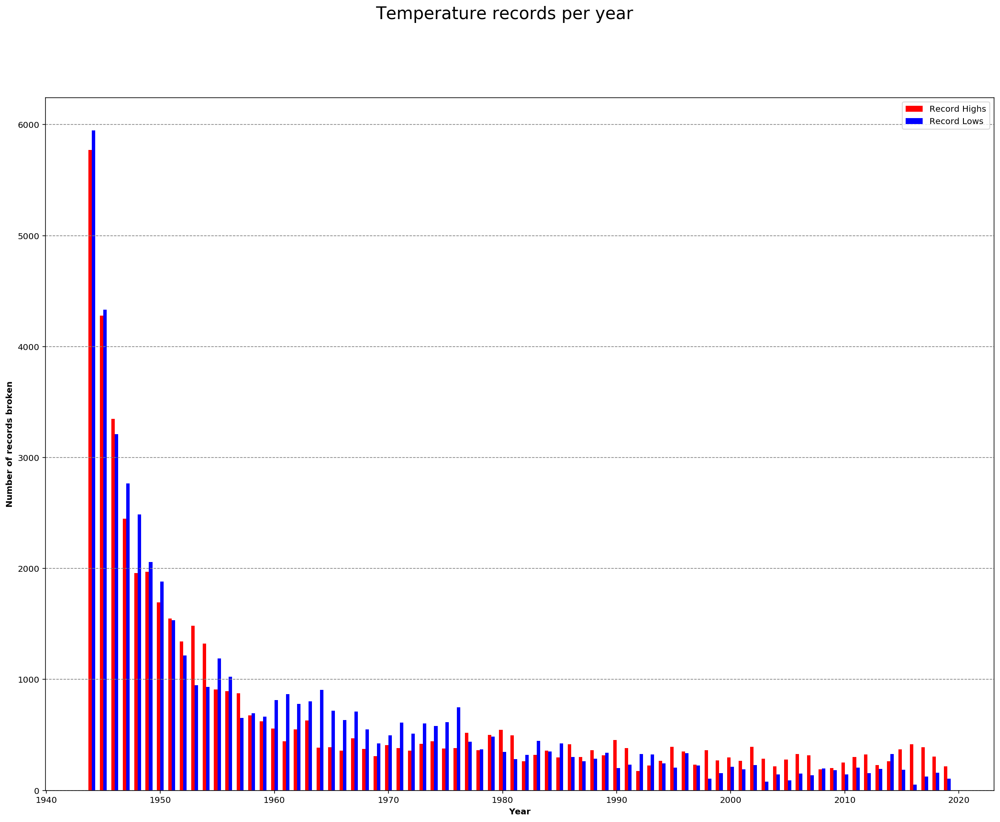

In [23]:
#set variables
fig, ax = plt.subplots(figsize=(20,15))

dfRowsHighs = dfAllRecords[(dfAllRecords.maxMinType == 'max')]
dfRowsLows = dfAllRecords[(dfAllRecords.maxMinType == 'min')]
  
dfHighs = dfRowsHighs.groupby(['year', 'maxMinType']).maxMinType.agg('count').to_frame('Highs').reset_index()
dfLows = dfRowsLows.groupby(['year', 'maxMinType']).maxMinType.agg('count').to_frame('Lows').reset_index()

barWidth = 0.3 # width of bar

# Make the plot
ax.bar(dfHighs['year']-(barWidth/2), dfHighs['Highs'], color='red', width=barWidth, label='Record Highs')
ax.bar(dfLows['year']+(barWidth/2), dfLows['Lows'], color='blue', width=barWidth,  label='Record Lows')


plt.xlabel('Year', fontweight='bold')
plt.ylabel('Number of records broken', fontweight='bold')

ax.yaxis.grid(color='gray', linestyle='dashed')
fig.suptitle('Temperature records per year', fontsize=20)
 
# Create legend & Show graphic
plt.legend()
plt.show();

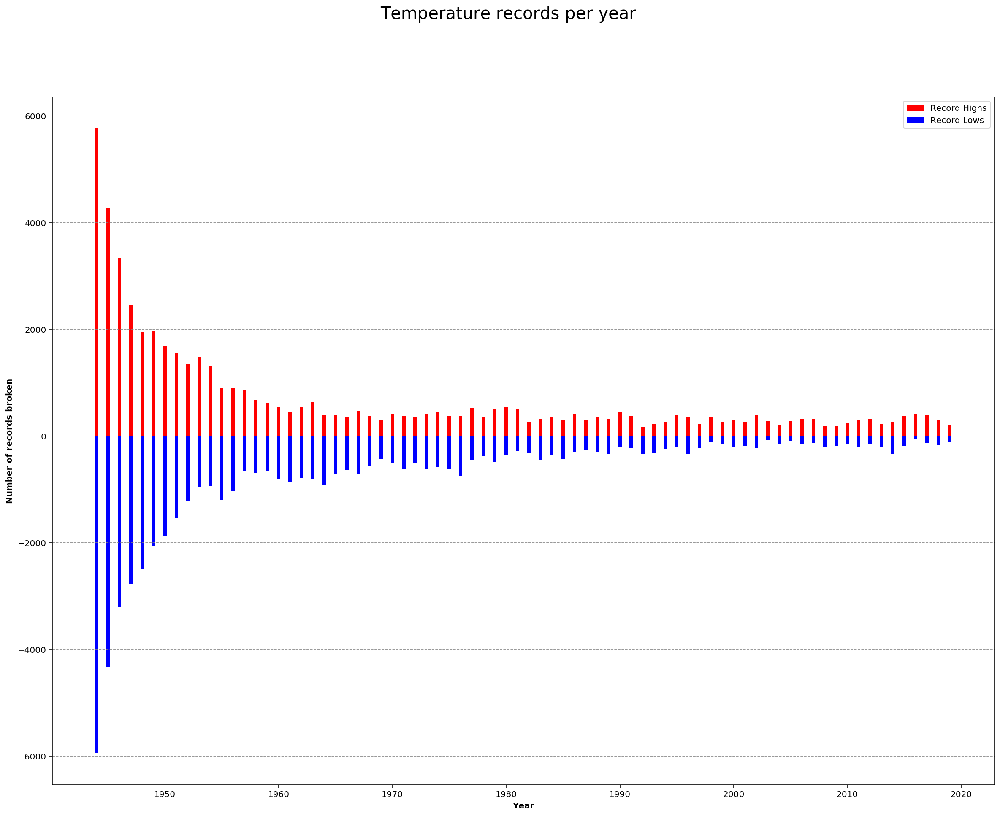

In [24]:
#set variables
fig, ax = plt.subplots(figsize=(20,15))

dfRowsHighs = dfAllRecords[(dfAllRecords.maxMinType == 'max')]
dfRowsLows = dfAllRecords[(dfAllRecords.maxMinType == 'min')]
  
dfHighs = dfRowsHighs.groupby(['year', 'maxMinType']).maxMinType.agg('count').to_frame('Highs').reset_index()
dfLows = dfRowsLows.groupby(['year', 'maxMinType']).maxMinType.agg('count').to_frame('Lows').reset_index()

barWidth = 0.3 # width of bar
# Make the plot

ax.bar(dfHighs['year'], dfHighs['Highs'], color='red', width=barWidth, label='Record Highs')
ax.bar(dfLows['year'], -dfLows['Lows'], color='blue', width=barWidth,  label='Record Lows')

plt.xlabel('Year', fontweight='bold')
plt.ylabel('Number of records broken', fontweight='bold')

ax.yaxis.grid(color='gray', linestyle='dashed')
fig.suptitle('Temperature records per year', fontsize=20)

# Create legend & Show graphic
plt.legend()
plt.show();


Now I want to show the ratios of high/low records if >=1, or -low/high records otherwise



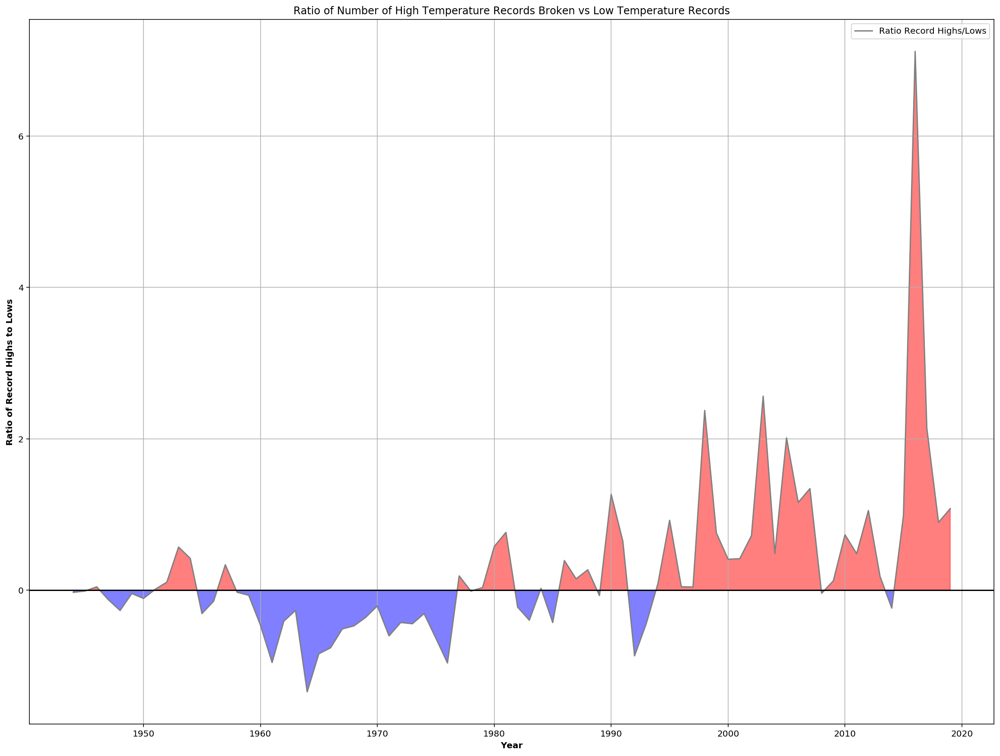

In [50]:
fig, ax = plt.subplots(figsize=(20,15))

dfRowsHighs = dfAllRecords[(dfAllRecords.maxMinType == 'max')]
dfRowsLows = dfAllRecords[(dfAllRecords.maxMinType == 'min')]
  
dfHighs = dfRowsHighs.groupby(['year', 'maxMinType']).maxMinType.agg('count').to_frame('Highs').reset_index()
dfLows = dfRowsLows.groupby(['year', 'maxMinType']).maxMinType.agg('count').to_frame('Lows').reset_index()

get_ratio = lambda high, low: high/low-1 if high/low >= 1 else -low/high+1
dfRats = dfHighs['Highs'].combine(dfLows['Lows'], get_ratio)

ratios = dfRats
years = dfHighs['year']

# Make the plot
ax.plot(years, ratios, color='gray', label='Ratio Record Highs/Lows')

ax.grid(zorder=0)
ax.axhline(y=0, color='black')

# https://stackoverflow.com/questions/38508556/how-to-avoid-gaps-with-matplotlib-fill-between-and-where
years2 = np.linspace(years.iloc[0], years.iloc[-1], len(years) * 100) 
ratios2 = np.interp(years2, years, ratios)  
# https://stackoverflow.com/questions/16417496/matplotlib-fill-between-multiple-lines
plt.fill_between(years2, 0, np.maximum(0, ratios2), where=ratios2 > 0,  color='red', alpha='0.5')
plt.fill_between(years2, ratios2, np.maximum(-10, 0), where=ratios2 < 0,  color='blue', alpha='0.5')

# Add xticks on the middle of the group bars
plt.xlabel('Year', fontweight='bold')
plt.ylabel('Ratio of Record Highs to Lows', fontweight='bold')
ax.set(title='Ratio of Number of High Temperature Records Broken vs Low Temperature Records')

# Create legend & Show graphic
plt.legend()
plt.show();